<a href="https://colab.research.google.com/github/PersGraphics/CNN/blob/main/4_2_Ejercicio4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Importación de librerías necesarias

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import matplotlib.pyplot as plt  
import keras 
import os  
import shutil  
import plotly.graph_objs as go 
import seaborn as sns  
import numpy as np

from glob import glob  
from tqdm import tqdm 
from keras.preprocessing.image import ImageDataGenerator 
from keras import Sequential  
from keras.models import load_model 
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout  
from keras.callbacks import ModelCheckpoint, EarlyStopping  
from tensorflow.keras.applications import InceptionV3


# 2. Definimos nuestras variables y exploramos el dataset



In [4]:
!unzip -n '/content/drive/MyDrive/archive (6) (1).zip' >> /dev/null

In [5]:
# Definimos variables
data_path = '/content/raw-img'
class_names = sorted(os.listdir(data_path))
num_classes = len(class_names)

print("Numero de clases:", num_classes)
print("Nombre de clases: \n", class_names)


Numero de clases: 10
Nombre de clases: 
 ['cane', 'cavallo', 'elefante', 'farfalla', 'gallina', 'gatto', 'mucca', 'pecora', 'ragno', 'scoiattolo']


# 3.------

In [6]:
class_sizes = []

for name in class_names:
    class_path = os.path.join(data_path, name)
    file_list = os.listdir(class_path)
    class_size = len(file_list)
    class_sizes.append(class_size)

print("Distribución de las clases:")
print(class_sizes)

Distribución de las clases:
[4863, 2623, 1446, 2112, 3098, 1668, 1866, 1820, 4821, 1862]


In [7]:
# Creamos un diccionario
class_name_size = {name: size for name, size in zip(class_names, class_sizes)}

In [8]:
sampled_data_path = './sampled-data'

if not os.path.exists(sampled_data_path):
    os.mkdir(sampled_data_path)

sample_percent = 0.1

class_names_dict = {
    'cane': 'PERRO',
    'cavallo': 'CABALLO',
    'elefante': 'ELEFANTE',
    'farfalla': 'MARIPOSA',
    'gallina': 'GALLINA',
    'gatto': 'GATO',
    'mucca': 'VACA',
    'pecora': 'OVEJA',
    'ragno': 'ARAÑA',
    'scoiattolo': 'ARDILLA'
}

for class_name in os.listdir(data_path):
    class_path = os.path.join(data_path, class_name)
    class_name_en = class_names_dict[class_name]
    sampled_class_path = os.path.join(sampled_data_path, class_name_en)

    if not os.path.exists(sampled_class_path):
        os.mkdir(sampled_class_path)

    image_files = os.listdir(class_path)
    image_class_size = class_name_size[class_name]
    num_images = min(2000, image_class_size)
    sampled_images = np.random.choice(image_files, size=num_images, replace=False)

    for image_name in sampled_images:
        src_path = os.path.join(class_path, image_name)
        dst_path = os.path.join(sampled_class_path, image_name)
        shutil.copyfile(src_path, dst_path)

# 4. Asignación del conjunto de datos de validación y entrenamiento

In [9]:
class_names = sorted(os.listdir(sampled_data_path))

class_sizes = []
for name in class_names:
    class_size = len(os.listdir(os.path.join(sampled_data_path, name)))
    class_sizes.append(class_size)
    
# Print the class distribution
print("Distribución de clases:\n", class_sizes)
print("Nombre de las clases:\n", class_names)

Distribución de clases:
 [2000, 1862, 2000, 1446, 2000, 1668, 2000, 1820, 2000, 1866]
Nombre de las clases:
 ['ARAÑA', 'ARDILLA', 'CABALLO', 'ELEFANTE', 'GALLINA', 'GATO', 'MARIPOSA', 'OVEJA', 'PERRO', 'VACA']


In [10]:
data_generator = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    validation_split=0.2
)

train_data = data_generator.flow_from_directory(
    directory=sampled_data_path,
    target_size=(256, 256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='training'
)

valid_data = data_generator.flow_from_directory(
    directory=sampled_data_path,
    target_size=(256, 256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='validation'
)

Found 14931 images belonging to 10 classes.
Found 3731 images belonging to 10 classes.


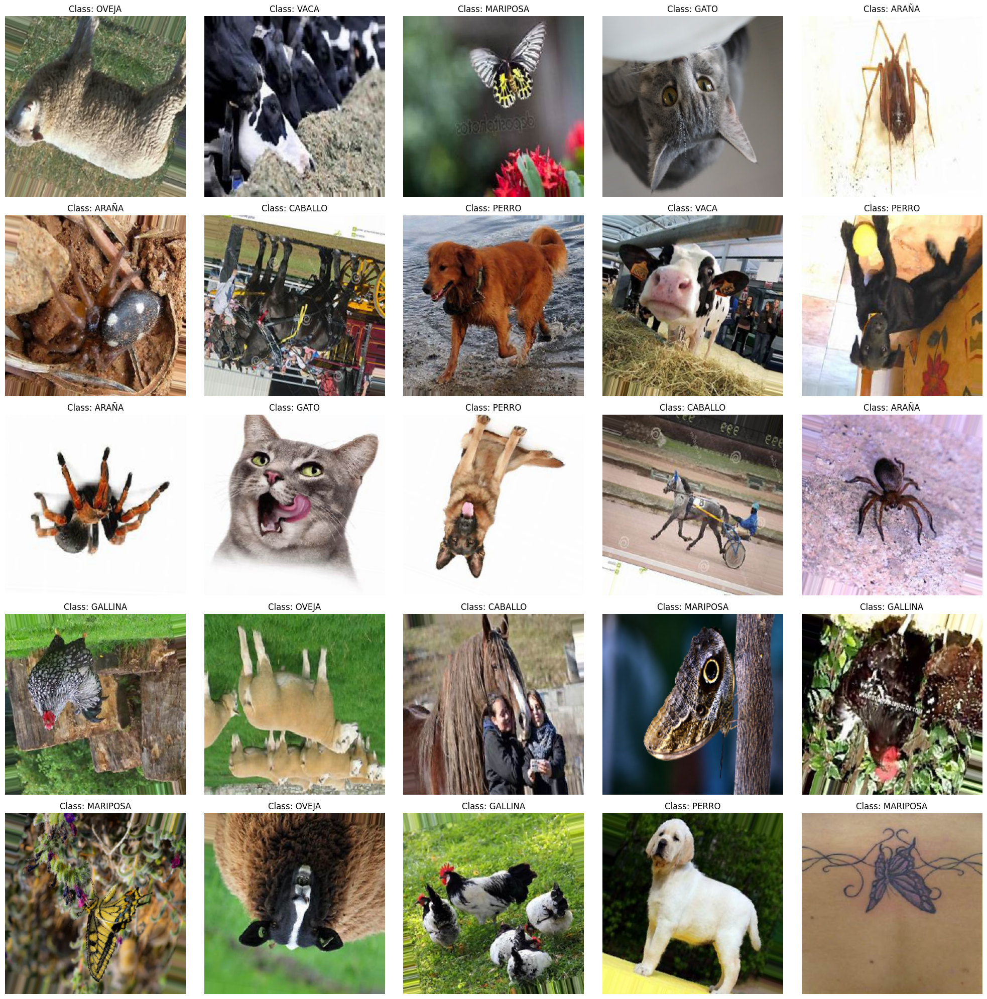

In [11]:
def show_image(image, image_title=None):
    plt.imshow(image)
    plt.title(image_title)
    plt.axis('off')


def get_random_data(data_tuple):
    images, labels = data_tuple
    idx = np.random.randint(len(images))
    image, label = images[idx], labels[idx]
    return image, label


plt.figure(figsize=(20, 20))

counter = 1

for images, labels in iter(train_data):
    image, label = get_random_data([images, labels])
    plt.subplot(5, 5, counter)
    show_image(image, image_title=f"Class: {class_names[int(label)]}")
    counter += 1
    if counter >= 26:
        break

plt.tight_layout()
plt.show()


# 5. Entrenamiento del modelo


In [12]:
name = "Inception"

base_model = InceptionV3(include_top=False, input_shape=(256, 256, 3), weights='imagenet')
base_model.trainable = False

inception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

inception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

callbacks = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

history = inception.fit(
    train_data,
    validation_data=valid_data,
    epochs=12,
    callbacks=callbacks,
    use_multiprocessing=True  # Para que vaya más rápido
)


87910968/87910968 [==============================] - 0s 0us/step
Epoch 1/12
467/467 [==============================] - 785s 2s/step - loss: 0.5366 - accuracy: 0.8328 - val_loss: 0.4034 - val_accuracy: 0.8703
Epoch 2/12
467/467 [==============================] - 771s 2s/step - loss: 0.3912 - accuracy: 0.8715 - val_loss: 0.3339 - val_accuracy: 0.8888
Epoch 3/12
467/467 [==============================] - 776s 2s/step - loss: 0.3526 - accuracy: 0.8844 - val_loss: 0.3361 - val_accuracy: 0.8904
Epoch 4/12
467/467 [==============================] - 785s 2s/step - loss: 0.3394 - accuracy: 0.8902 - val_loss: 0.3270 - val_accuracy: 0.8909
Epoch 5/12
467/467 [==============================] - 772s 2s/step - loss: 0.3247 - accuracy: 0.8924 - val_loss: 0.3471 - val_accuracy: 0.8882
Epoch 6/12
467/467 [==============================] - 718s 2s/step - loss: 0.3105 - accuracy: 0.8978 - val_loss: 0.3502 - val_accuracy: 0.8829
Epoch 7/12
467/467 [==============================] - 803s 2s/step - loss: 0.

# 6. Evaluación

In [13]:
test_loss, test_accuracy = inception.evaluate(valid_data, steps=valid_data.samples // valid_data.batch_size)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

116/116 [==============================] - 59s 509ms/step - loss: 0.3193 - accuracy: 0.8976
Test Loss: 0.3193344175815582
Test Accuracy: 0.8976293206214905


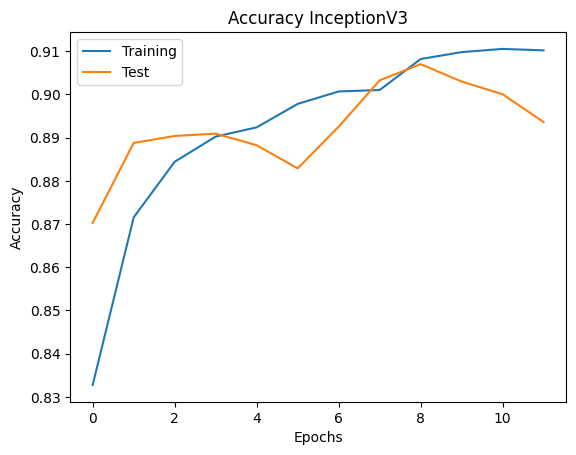

In [14]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Accuracy InceptionV3')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training', 'Test'], loc='upper left')
plt.show()

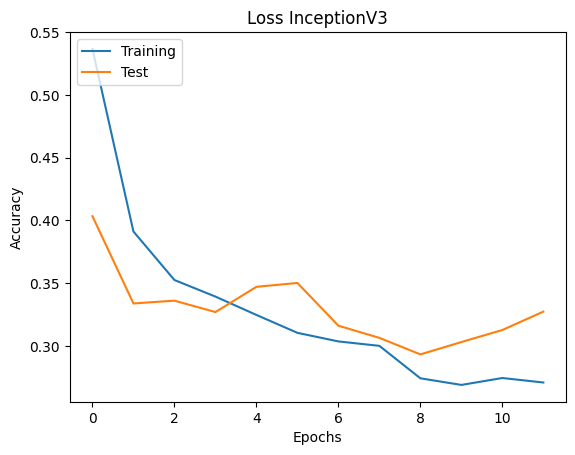

In [15]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss InceptionV3')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training', 'Test'], loc='upper left')
plt.show()

1/1 [==============================] - 0s 26ms/step


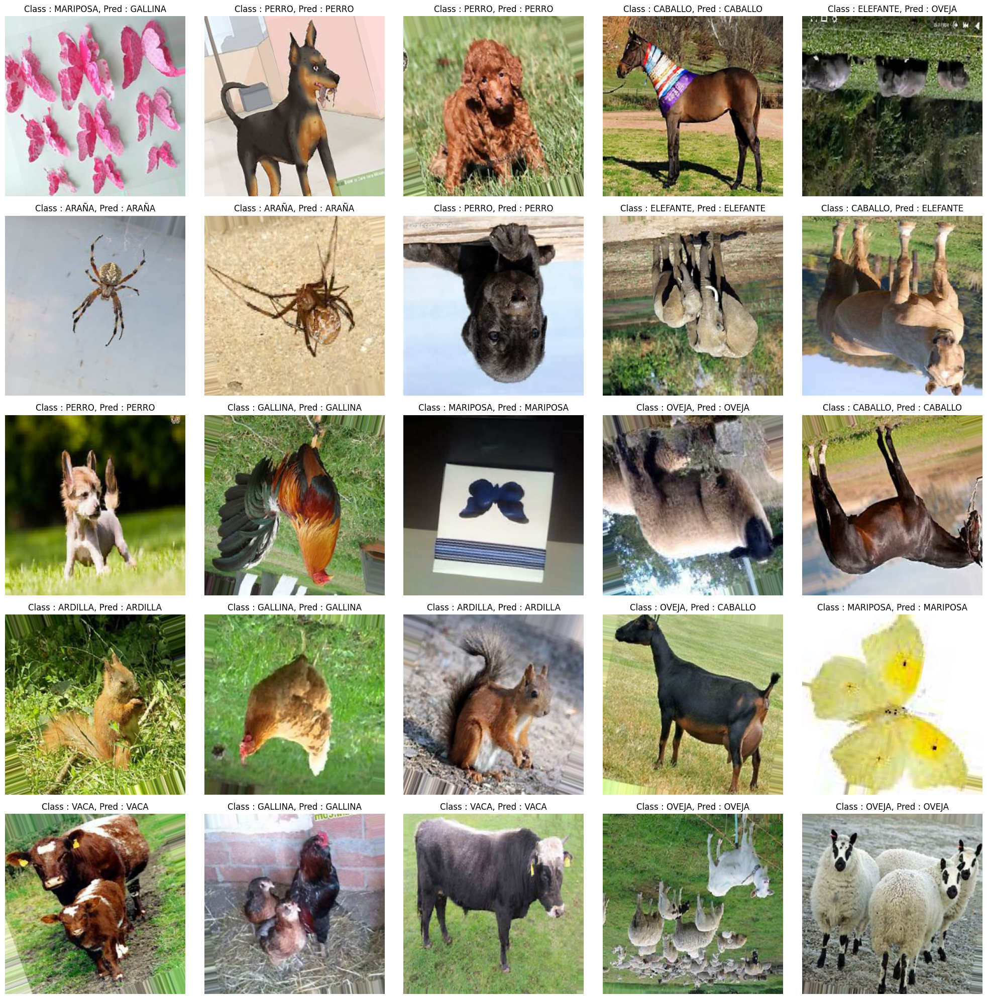

In [16]:
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(valid_data):
    
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(inception.predict(image[np.newaxis,...]))]

    plt.subplot(5,5,i)
    show_image(image, image_title=f"Class : {class_names[int(label)]}, Pred : {pred_label}")
    
    i+=1
    if i>=26: break
        
plt.tight_layout()
plt.show()